In [1]:
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

#other
import os, re
import random
import datetime
import pandas as pd
from tqdm.notebook import tqdm
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.model_selection import train_test_split

# Set random seed for reproducibility
seed = 6969
# seed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", seed)
random.seed(seed)
torch.manual_seed(seed)

Random Seed:  6969


In [2]:
import torchvision.transforms as transforms
import torchvision.datasets as datasets

# Root directory for dataset
dataroot = "/kaggle/input/resizebm/bone_marrow_cell_dataset(resize)/MON/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
# size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100 # Original is 5 on a dataset of 1 million

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Create a list to store all the image paths
image_paths = []

# Iterate over all subdirectories within the NGB class folder
for subdir_name in os.listdir(dataroot):
    subdir_path = os.path.join(dataroot, subdir_name)
    if os.path.isdir(subdir_path):
        # Iterate over all files in the subdirectory
        for filename in os.listdir(subdir_path):
            # Get the full path of the image
            image_path = os.path.join(subdir_path, filename)
            # Add the image path to the list
            image_paths.append(image_path)

# Create a custom dataset to load images from the list of image paths
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load the image
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")

        # Apply transformations if specified
        if self.transform:
            image = self.transform(image)

        return image

# Create the dataset
dataset = CustomDataset(image_paths, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]))

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Check the number of images
print("Total number of images:", len(dataset))

Total number of images: 4040


Class count

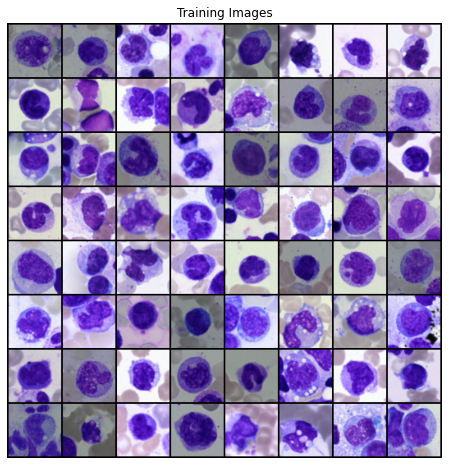

In [3]:
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# DCGAN Implementation

### Initialize weights

In [4]:
# Custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Generator

In [5]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
    

In [6]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### Discriminator

In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)
    # Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [8]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Training

### Loss Function and Optimizers

In [9]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## Begin Training

In [10]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        # Convert label tensor to float type
        label = label.float()
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 1000 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 250 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/100][0/32]	Loss_D: 1.8613	Loss_G: 3.9931	D(x): 0.4853	D(G(z)): 0.5823 / 0.0268
[1/100][0/32]	Loss_D: 0.2486	Loss_G: 5.9762	D(x): 0.9119	D(G(z)): 0.0072 / 0.0048
[2/100][0/32]	Loss_D: 0.1301	Loss_G: 5.6226	D(x): 0.9656	D(G(z)): 0.0363 / 0.0052
[3/100][0/32]	Loss_D: 0.1714	Loss_G: 7.1799	D(x): 0.9238	D(G(z)): 0.0346 / 0.0012
[4/100][0/32]	Loss_D: 0.5478	Loss_G: 9.4097	D(x): 0.9814	D(G(z)): 0.3396 / 0.0003
[5/100][0/32]	Loss_D: 0.3894	Loss_G: 2.2801	D(x): 0.9510	D(G(z)): 0.2333 / 0.1714
[6/100][0/32]	Loss_D: 0.7508	Loss_G: 5.3891	D(x): 0.8797	D(G(z)): 0.3835 / 0.0079
[7/100][0/32]	Loss_D: 0.4132	Loss_G: 2.7237	D(x): 0.7764	D(G(z)): 0.0499 / 0.1033
[8/100][0/32]	Loss_D: 0.9386	Loss_G: 7.4970	D(x): 0.9519	D(G(z)): 0.5560 / 0.0010
[9/100][0/32]	Loss_D: 0.4917	Loss_G: 2.2865	D(x): 0.7472	D(G(z)): 0.0972 / 0.1230
[10/100][0/32]	Loss_D: 0.7440	Loss_G: 1.8215	D(x): 0.6666	D(G(z)): 0.1989 / 0.1954
[11/100][0/32]	Loss_D: 0.5863	Loss_G: 3.1540	D(x): 0.7747	D(G(z)): 0.23

In [11]:
# After the training loop
# Saving the state dictionary of the netG
torch.save(netG.state_dict(), 'net_g_MON.pth')


## Results

### Loss Plot

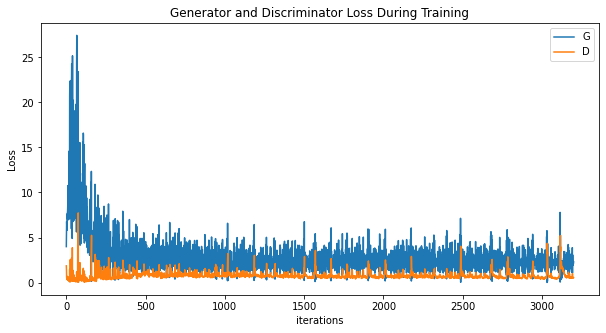

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Training Process

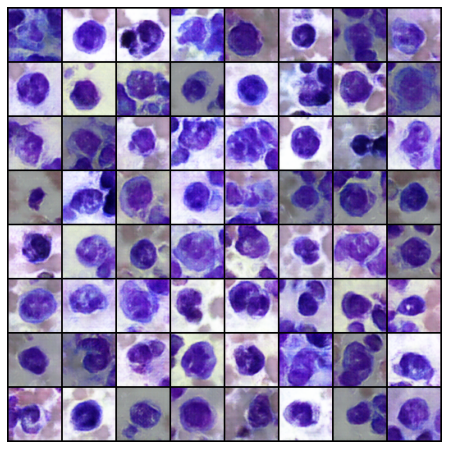

In [13]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

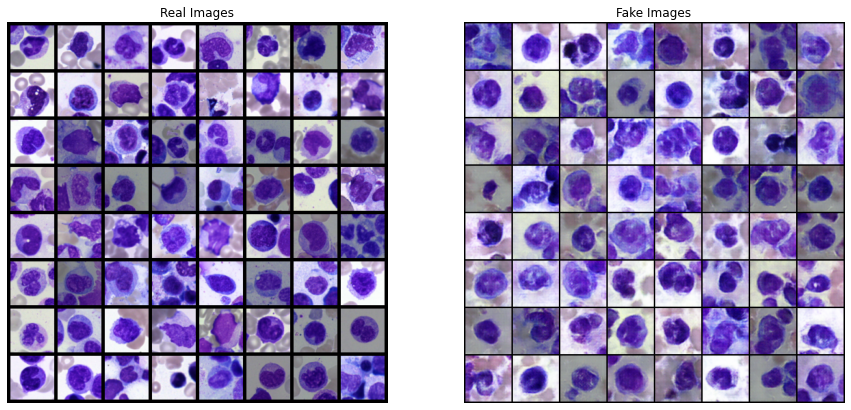

In [14]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Generate 8000 images and download

In [15]:
# import torch
# # Assuming 'MyModel' is your model class and 'model' is an instance of this class
# netG = netG
# netG.load_state_dict(torch.load('/kaggle/input/neg-g-bla/net_g_BLA.pth'))
# netG.eval()  # Set the model to evaluation mode if you're using it for inference


## Generate Images

In [16]:
from torchvision import transforms
import torchvision.utils as vutils
import os

# Set the generator to evaluation mode
netG.eval()

# Transformation to resize images to 400x400
resize_transform = transforms.Resize((500, 500))

generated_MON = []
for _ in range(5000):
    noise = torch.randn(1, nz, 1, 1, device=device)  # Generate random noise
    with torch.no_grad():
        fake_image = netG(noise).detach().cpu()  # Generate fake image
        resized_image = resize_transform(fake_image)  # Resize image
    generated_MON.append(resized_image)

save_dir = "/kaggle/working/generated_MON"  # Updated to save in the Kaggle working directory
os.makedirs(save_dir, exist_ok=True)

num_saved_images = 0  # Counter to track the number of saved images

for i, img in enumerate(generated_MON):
    image_path = f"{save_dir}/MON_{i+1}.jpg"
    vutils.save_image(img, image_path, normalize=True)  # Saving as JPG

    # Verification step to check if the image is saved
    if os.path.exists(image_path):
        num_saved_images += 1
    else:
        print(f"Failed to save image: {image_path}")

# Print total number of images saved
print(f"Total images saved: {num_saved_images}")

# Optional: Assert to ensure all images are saved
assert num_saved_images == len(generated_MON), "Not all images have been saved successfully."


Total images saved: 5000


In [17]:
import shutil
shutil.make_archive("/kaggle/working/generated_MON", 'zip', save_dir)  # Creating a ZIP file for download


'/kaggle/working/generated_MON.zip'

In [18]:
# from torchvision import transforms
# import torchvision.utils as vutils
# import os

# # Set the generator to evaluation mode
# netG.eval()

# # Transformation to resize images to 400x400
# resize_transform = transforms.Resize((500, 500))

# generated_BLA = []
# for _ in range(5000):
#     noise = torch.randn(1, nz, 1, 1, device=device)  # Generate random noise
#     with torch.no_grad():
#         fake_image = netG(noise).detach().cpu()  # Generate fake image
#         resized_image = resize_transform(fake_image)  # Resize image
#     generated_BLA.append(resized_image)

# save_dir = "/kaggle/working/generated_BLA"  # Updated to save in the Kaggle working directory
# os.makedirs(save_dir, exist_ok=True)

# num_saved_images = 0  # Counter to track the number of saved images

# for i, img in enumerate(generated_BLA):
#     image_path = f"{save_dir}/BLA_{i+1}.jpg"
#     vutils.save_image(img, image_path, normalize=True)  # Saving as JPG

#     # Verification step to check if the image is saved
#     if os.path.exists(image_path):
#         num_saved_images += 1
#     else:
#         print(f"Failed to save image: {image_path}")

# # Print total number of images saved
# print(f"Total images saved: {num_saved_images}")

# # Optional: Assert to ensure all images are saved
# assert num_saved_images == len(generated_BLA), "Not all images have been saved successfully."


In [19]:
# from torchvision import transforms
# import torchvision.utils as vutils
# import os

# # Set the generator to evaluation mode
# netG.eval()

# # Transformation to resize images to 400x400
# resize_transform = transforms.Resize((500, 500))

# generated_PMO = []
# for _ in range(5000):
#     noise = torch.randn(1, nz, 1, 1, device=device)  # Generate random noise
#     with torch.no_grad():
#         fake_image = netG(noise).detach().cpu()  # Generate fake image
#         resized_image = resize_transform(fake_image)  # Resize image
#     generated_PMO.append(resized_image)

# save_dir = "/kaggle/working/generated_PMO"  # Updated to save in the Kaggle working directory
# os.makedirs(save_dir, exist_ok=True)

# num_saved_images = 0  # Counter to track the number of saved images

# for i, img in enumerate(generated_PMO):
#     image_path = f"{save_dir}/PMO_{i+1}.jpg"
#     vutils.save_image(img, image_path, normalize=True)  # Saving as JPG

#     # Verification step to check if the image is saved
#     if os.path.exists(image_path):
#         num_saved_images += 1
#     else:
#         print(f"Failed to save image: {image_path}")

# # Print total number of images saved
# print(f"Total images saved: {num_saved_images}")

# # Optional: Assert to ensure all images are saved
# assert num_saved_images == len(generated_PMO), "Not all images have been saved successfully."


In [20]:
# from torchvision import transforms
# import torchvision.utils as vutils
# import os

# # Set the generator to evaluation mode
# netG.eval()

# # Transformation to resize images to 400x400
# resize_transform = transforms.Resize((500, 500))

# generated_NGB = []
# for _ in range(5000):
#     noise = torch.randn(1, nz, 1, 1, device=device)  # Generate random noise
#     with torch.no_grad():
#         fake_image = netG(noise).detach().cpu()  # Generate fake image
#         resized_image = resize_transform(fake_image)  # Resize image
#     generated_NGB.append(resized_image)

# save_dir = "/kaggle/working/generated_NGB"  # Updated to save in the Kaggle working directory
# os.makedirs(save_dir, exist_ok=True)

# num_saved_images = 0  # Counter to track the number of saved images

# for i, img in enumerate(generated_NGB):
#     image_path = f"{save_dir}/NGB_{i+1}.jpg"
#     vutils.save_image(img, image_path, normalize=True)  # Saving as JPG

#     # Verification step to check if the image is saved
#     if os.path.exists(image_path):
#         num_saved_images += 1
#     else:
#         print(f"Failed to save image: {image_path}")

# # Print total number of images saved
# print(f"Total images saved: {num_saved_images}")

# # Optional: Assert to ensure all images are saved
# assert num_saved_images == len(generated_NGB), "Not all images have been saved successfully."


## Save Images

In [21]:
# import shutil
# shutil.make_archive("/kaggle/working/generated_BLA", 'zip', save_dir)  # Creating a ZIP file for download


In [22]:
# import torchvision.utils as vutils
# import os

# save_dir = "generated_images"
# os.makedirs(save_dir, exist_ok=True)

# for i, img in enumerate(generated_images):
#     vutils.save_image(img, f"{save_dir}/image_{i+1}.png", normalize=True)


In [23]:
# import shutil
# shutil.make_archive("generated_images", 'zip', save_dir)


# Classification Code

In [24]:
# environment dependent paths
def get_root_and_log_path():
    pwd = os.popen('echo $PWD').read().strip()
    if pwd == '/content':
        from google.colab import drive
        drive.mount('/content/drive')
        return ('/content/drive/My Drive/Bone Marrow Cell Classification Project/archive',
                os.path.join(
                    '/content/drive/My Drive/Bone Marrow Cell Classification Project/archive',
                    'logs',
                    datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
                ))
    elif pwd == '/kaggle/working':
        return ('../input/bone-marrow-gan',
                os.path.join(
                    'kaggle/temp',
                    'logs',
                    datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
                ))
    else:
        return ('/media/abetrack3/New Volume/archive',
                os.path.join(
                    '/media/abetrack3/New Volume/archive',
                    'logs',
                    datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
                ))

In [25]:
ROOT_DATASET_PATH , LOG_DIR = get_root_and_log_path()
DATASET_PATH = f'{ROOT_DATASET_PATH}/bone-marrow-gan'


GRAY_SCALE = False
IMAGE_SIZE = 400
CHANNELS = 1 if GRAY_SCALE else 3
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, CHANNELS]
OUTPUT_SHAPE = 6
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'
BATCH_SIZE = 32
EPOCHS = 20
TEST_SIZE = 0.2
LEARNING_RATE = 0.001
MODEL_NO = 2
ADDITIONAL_AUGMENTATION = False
RESAMPLE_SIZE = 16_000

# Loading Resources

In [26]:
import os, re
import random
import datetime
import pandas as pd
from tqdm.notebook import tqdm
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Convolution2D, Convolution3D, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, Input, RandomRotation, RandomZoom, RandomTranslation
from matplotlib import pyplot as plt
import numpy as np
from sklearn.metrics import classification_report, roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.utils import plot_model
from typing import List, Tuple

# os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'

## Collecting paths of all image files and their respective labels in a list

In [27]:
paths_and_labels = []
def get_paths_and_labels():
    pattern = re.compile(r'.*([A-Z]{3})_[0-9]+\.jpg$')
    progress_bar = tqdm(total=81487)
    for dirname, _, filenames in os.walk('/kaggle/input/bm-gan-dataset/New_dataset'):
        for filename in filenames:
            image_path = os.path.join(dirname, filename)
            image_label = pattern.findall(image_path)[0]
            paths_and_labels.append((image_path, image_label))
            progress_bar.update(1)
get_paths_and_labels()

  0%|          | 0/81487 [00:00<?, ?it/s]

## Removing Errorneous images

There are two types of errorneous images found while attempting to train the model
- The one that gives the error `Invalid Argument: jpeg::Uncompressed failed. Invalid JPEG data or crop window".`
- The one that gives the error `Corrupt JPEG data: 694 extraneous bytes before marker 0xd9`

The first one makes the code crash in runtime while the second only shows the error but continues to run anyway. All of these images are manually removed.

In [28]:
# target_index = 0
# for index in range(len(paths_and_labels)):
#     if 'MYB_05528.jpg' in paths_and_labels[index][0]:
#         target_index = index
#         break
#     index += 1
# print(target_index)

In [29]:
# erroneous_index = [154407, 142934, 114530, 103387, 82990, 50923, 37625, 17332, 16616, 4429]
# erroneous_index.sort(reverse=True)
# for index in erroneous_index:
#     paths_and_labels.pop(index)

## Original Class Counts 

In [30]:
pd.DataFrame(paths_and_labels, columns=['File_Path', 'Category']).Category.value_counts()

PMO    16994
BLA    16973
NGB    14968
PLM    12629
EOS    10883
MON     9040
Name: Category, dtype: int64

## Removing classes that has low instance count

In [31]:
# classes_to_be_removed = ['MYB', 'EOS', 'MON', 'NIF', 'MMZ', 'PEB', 'BAS', 'HAC', 'OTH', 'LYI', 'FGC', 'KSC', 'ABE', 'NGB', 'PLM']
# paths_and_labels = [(path, label) for path, label in tqdm(paths_and_labels) if label not in classes_to_be_removed]

## resizing Images

In [32]:
# from PIL import Image

# # IMAGE_SIZE = 64  # New size for the image

# def resize_image(image_path):
#     with Image.open(image_path) as img:
#         # Check if the image is not already the desired size to avoid unnecessary work
#         if img.size != (IMAGE_SIZE, IMAGE_SIZE):
#             img = img.resize((IMAGE_SIZE, IMAGE_SIZE), Image.ANTIALIAS)
#             img.save(image_path)  # Save the resized image back to the same path

# # Assuming paths_and_labels is already filled from the previous code block
# for path, _ in paths_and_labels:
#     resize_image(path)


## Resampling Data

In [33]:
### Undersampling Data (Select First N Samples)
def undersample_data(image_paths_and_labels: List[Tuple[str, str]]):
    length = len(image_paths_and_labels)
    return image_paths_and_labels[:min(RESAMPLE_SIZE, length)]

### Oversampling Data (Blind Copy upto total N Samples)
def oversample_data(image_paths_and_labels: List[Tuple[str, str]]):
    image_paths_and_labels = image_paths_and_labels[:] #duplicating list through list slicing
    index = 0
    while(len(image_paths_and_labels) < RESAMPLE_SIZE):
        image_paths_and_labels.append(image_paths_and_labels[index])
        index += 1
    return image_paths_and_labels

### Resample
def resample_data():
    categories = list(set([label for path, label in paths_and_labels]))
    label_separated_paths_and_labels = {}
    for each_category in categories:
        label_separated_paths_and_labels[each_category] = []
    for path, label in tqdm(paths_and_labels):
        label_separated_paths_and_labels[label].append((path, label))
    new_list = []
    for each_category in  categories:
        if len(label_separated_paths_and_labels[each_category]) < RESAMPLE_SIZE:
            new_list += oversample_data(label_separated_paths_and_labels[each_category])
        else:
            new_list += undersample_data(label_separated_paths_and_labels[each_category])
    return new_list

paths_and_labels = resample_data()

  0%|          | 0/81487 [00:00<?, ?it/s]

### (DEPRECATED) Oversampling data (Blind Copy)

In [34]:
# def over_sample_blid_copy():
#     oversampling_factor_map = {
#         'PMO' : 2,
#         'BLA' : 2,
#         'NGB' : 2,
#         'PLM' : 3
#     }
#     DEFAULT_FACTOR = 0
#     oversampled_paths_and_labels = []
#     for image_path, label in tqdm(paths_and_labels):
#         oversampling_factor = oversampling_factor_map.get(label, DEFAULT_FACTOR)
#         oversampled_paths_and_labels += [(image_path, label)] * (oversampling_factor - 1)
#     return oversampled_paths_and_labels
# paths_and_labels += over_sample_blid_copy()

## Creating pandas DataFrame

In [35]:
df = pd.DataFrame(paths_and_labels, columns=['File_Path', 'Category'])
df

,File_Path,Category
0,/kaggle/input/bm-gan-dataset/New_dataset/PLM/3...,PLM
1,/kaggle/input/bm-gan-dataset/New_dataset/PLM/3...,PLM
2,/kaggle/input/bm-gan-dataset/New_dataset/PLM/3...,PLM
3,/kaggle/input/bm-gan-dataset/New_dataset/PLM/3...,PLM
4,/kaggle/input/bm-gan-dataset/New_dataset/PLM/3...,PLM
...,...,...
95995,/kaggle/input/bm-gan-dataset/New_dataset/EOS/5...,EOS
95996,/kaggle/input/bm-gan-dataset/New_dataset/EOS/5...,EOS
95997,/kaggle/input/bm-gan-dataset/New_dataset/EOS/5...,EOS
95998,/kaggle/input/bm-gan-dataset/New_dataset/EOS/5...,EOS


In [36]:
df.Category.value_counts()

PLM    16000
BLA    16000
MON    16000
NGB    16000
PMO    16000
EOS    16000
Name: Category, dtype: int64

# Splitting Dataset

In [37]:
df_train, df_test = train_test_split(
    df,
    test_size=TEST_SIZE,
    random_state=21,
    stratify=df.Category
)

df_val, df_test = train_test_split(
    df_test,
#     test_size=1.0/3.0,
    test_size=0.5,
    random_state=21,
    stratify=df_test.Category
)

# One-hot encoding

In [38]:
# One-hot encoding
def get_one_hot_encoding(data_frame, join = False):
    one_hot_encoded_ = pd.get_dummies(data_frame.Category)
    if join:
        return data_frame.join(one_hot_encoded_)
    else:
        return one_hot_encoded_

category_list = list(get_one_hot_encoding(df))
print(category_list)
get_one_hot_encoding(df)

['BLA', 'EOS', 'MON', 'NGB', 'PLM', 'PMO']


,BLA,EOS,MON,NGB,PLM,PMO
0,0,0,0,0,1,0
1,0,0,0,0,1,0
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,0,0,0,0,1,0
...,...,...,...,...,...,...
95995,0,1,0,0,0,0
95996,0,1,0,0,0,0
95997,0,1,0,0,0,0
95998,0,1,0,0,0,0


# Data Batches

Turns out, it requires too much memory just from loading the entire dataset into memory. By creating data batches instead of laoding the entire dataset, we can avoid this problem

## Processing images

In [39]:
def process_image(image_path : str, img_size : int = IMAGE_SIZE):
    """
    Takes an image file path and turns the image into tensor
    """
#     with tf.device('/GPU:0'):
    # Reads an image file
    image = tf.io.read_file(image_path)
    # turn jpg into numerical tensor with 3 color chanel
    image = tf.image.decode_jpeg(image, channels=3)
    # convert the color channel values from 0-255 to 0-1
    image = tf.image.convert_image_dtype(image, tf.float32)
    #resize image to our desired value
    image = tf.image.resize(image, size=[img_size, img_size])
    #convert to gray scale
    if GRAY_SCALE:
        image = tf.image.rgb_to_grayscale(image)

    return image

# df.File_Path.map(process_image) # this is a memory killer code.... leave it commented
# df

## Image Augmentation

In [40]:
if ADDITIONAL_AUGMENTATION:
    with tf.device('/GPU:0'):
        augmentation_layers = Sequential()
        augmentation_layers.add(RandomRotation(factor=(-0.2, 0.2), fill_mode='nearest'))
        augmentation_layers.add(RandomZoom(height_factor=(0.0, 0.2), width_factor=(0.0, 0.2), fill_mode='nearest'))
        augmentation_layers.add(RandomTranslation(height_factor=(0.0, 0.2), width_factor=(0.0, 0.2), fill_mode='nearest'))

def augment_image(image):
    """
    Takes a tensor image and randomly augment it
    """
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, 0.2)
    image = tf.image.random_contrast(image, 0.2, 1.0)
    if ADDITIONAL_AUGMENTATION:
        with tf.device('/GPU:0'):
            image = augmentation_layers(image)
    return image

## functions for creating Data batches

In [41]:
def get_image_label(image_path : str, label : str) -> tuple:
    """
    Takes an image file path name and the associated label,
    processes the image and return a tuple of (image, label).
    """
    image = process_image(image_path, IMAGE_SIZE)
    return image, label

def get_augmented_image_label(image_path : str, label : str) -> tuple:
    image = process_image(image_path, IMAGE_SIZE)
    image = augment_image(image)
    return image, label

def create_data_batches(x, y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If the data is a test dataset, we probably don't have labels
    if test_data:
        print('Creating test data batches...')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # tuple containing only filepaths -- no labels
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
    elif valid_data:
        print('Creating validation data batches...')
        data = tf.data.Dataset.from_tensor_slices(
            (
                tf.constant(x),  # filepaths
                tf.constant(y)  # labels
            )
        )
        data_batch = data.map(get_image_label, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)
        return data_batch

    else:
        print('Creating training data batches')
        # turn filepaths into tensors
        data = tf.data.Dataset.from_tensor_slices(
            (
                tf.constant(x),  # filepaths
                tf.constant(y)  # labels
            )
        )
        # Shuffling path_names and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(x))

        # create (image, label) tuples. (This also turns the image path into a preprocessed image)
        data = data.map(get_augmented_image_label, num_parallel_calls=tf.data.AUTOTUNE)

        # turn the training data into batches
        data_batch = data.batch(batch_size)
        
        # configuring data_batch to preload data to save training time
        data_batch = data_batch.prefetch(tf.data.AUTOTUNE)
        
        return data_batch

## Creating training data batches

In [42]:
# df_train = df
training_data_batches = create_data_batches(
    df_train.File_Path,
    get_one_hot_encoding(df_train)
)
training_data_batches.element_spec

Creating training data batches


(TensorSpec(shape=(None, 400, 400, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 6), dtype=tf.uint8, name=None))

## Creating validation data batches

In [43]:
validation_data_batches = create_data_batches(
    df_val.File_Path,
    get_one_hot_encoding(df_val),
    valid_data=True
)
validation_data_batches.element_spec

Creating validation data batches...


(TensorSpec(shape=(None, 400, 400, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 6), dtype=tf.uint8, name=None))

# Modeling

## Creating and Building Model

### mobilenet_v2_130_224 model

In [44]:
def create_mobilenet_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
    print('Building Model with: ' + model_url)

    # setup model layers
    model_ = tf.keras.Sequential(
        [
            # Layer 1 input layer
            hub.KerasLayer(
                model_url,
                trainable=True,
                arguments=dict(batch_norm_momentum=0.997)
            ),

            # Layer 2 output Layer
            tf.keras.layers.Dense(
                units = output_shape,
                activation = 'softmax'
            )
        ]
    )

    # Compile the model
    model_.compile(
        loss = tf.keras.losses.CategoricalCrossentropy(),
        optimizer = tf.keras.optimizers.RMSprop(learning_rate = LEARNING_RATE),
        metrics = ['accuracy']
    )

    # Build the model
    model_.build(input_shape)

    print(model_.summary())

    return model_

### Custom CNN Model

In [45]:
def create_custom_cnn_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE):
    model_ = Sequential()

    model_.add(Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)))

    model_.add(Convolution2D(
        filters=32,
        kernel_size=(3, 3),
        activation = 'relu',
        data_format='channels_last'
    ))
    model_.add(BatchNormalization(axis = -1))
    model_.add(AveragePooling2D(pool_size = (2, 2), data_format="channels_last"))
#     model_.add(Dropout(0.2))

    model_.add(Convolution2D(64, (3, 3), activation = 'relu'))
    model_.add(BatchNormalization(axis = -1))
    model_.add(AveragePooling2D(pool_size = (2, 2), data_format="channels_last"))
#     model_.add(Dropout(0.2))

    model_.add(Convolution2D(128, (3, 3), activation = 'relu'))
    model_.add(BatchNormalization(axis = -1))
    model_.add(AveragePooling2D(pool_size = (2, 2), data_format="channels_last"))
#     model_.add(Dropout(0.2))

    model_.add(Convolution2D(256, (3, 3), activation = 'relu'))
    model_.add(BatchNormalization(axis = -1))
    model_.add(AveragePooling2D(pool_size = (2, 2), data_format="channels_last"))
#     model_.add(Dropout(0.2))

    model_.add(Convolution2D(512, (3, 3), activation = 'relu'))
    model_.add(BatchNormalization(axis = -1))
    model_.add(AveragePooling2D(pool_size = (2, 2), data_format="channels_last"))


    model_.add(Convolution2D(1024, (3, 3), activation = 'relu'))
    model_.add(BatchNormalization(axis = -1))
    model_.add(AveragePooling2D(pool_size = (2, 2), data_format="channels_last"))
#     model_.add(Dropout(0.2))

    model_.add(Convolution2D(2048, (3, 3), activation = 'relu'))
    model_.add(BatchNormalization(axis = -1))
    model_.add(AveragePooling2D(pool_size = (2, 2), data_format="channels_last"))
#     model_.add(Dropout(0.2))





    model_.add(Flatten())

    model_.add(Dense(activation = 'relu', units=256))
    model_.add(Dense(activation = 'relu', units=128))
    model_.add(Dense(activation = 'relu', units=64))
    model_.add(Dense(activation = 'relu', units=32))
    model_.add(Dense(activation = 'relu', units=16))
    model_.add(Dense(activation = 'relu', units=6))
    model_.add(BatchNormalization(axis = -1))

#    model_.add(Dense(activation = 'relu', units=6))
#    model_.add(BatchNormalization(axis = -1))
#     model_.add(Dropout(0.1))

    model_.add(Dense(activation = 'softmax', units=OUTPUT_SHAPE))

    model_.compile(
        optimizer = tf.keras.optimizers.RMSprop(learning_rate = LEARNING_RATE),
        loss = tf.keras.losses.CategoricalCrossentropy(),
        metrics = ['accuracy']
    )

    model_.build(INPUT_SHAPE)

    return model_

### Model Factory

In [46]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
    if MODEL_NO == 1:
        return create_mobilenet_model(input_shape, output_shape, model_url)
    elif MODEL_NO == 2:
        return create_custom_cnn_model(input_shape, output_shape)

### Plotting Model

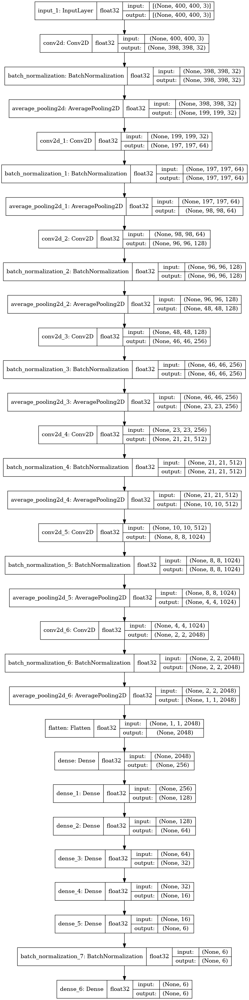

In [47]:
plot_model(create_model(), show_shapes=True, show_dtype=True, expand_nested=True)

## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving

Tensorboard for tracking model progress
Early stopping to stop training early if a model stops improving

In [48]:
%load_ext tensorboard

In [49]:
def get_tensorboard_instance():
    return tf.keras.callbacks.TensorBoard(LOG_DIR)
def get_early_stopping_instance():
    return tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                            patience = 3)
def get_reduce_lr_on_plateau_instance():
    return tf.keras.callbacks.ReduceLROnPlateau(factor=0.1,
                                                patience=3,
                                                verbose=1,
                                                min_lr=0.0000001)

## Training and fitting data into model

In [50]:
from keras.callbacks import ModelCheckpoint

In [51]:
# def train_model(train_data, val_data):
#     """
#     Trains a given model and return the trained version
#     """
#     # create a model
#     model_ = create_model()
    
#     print(model_.summary())

#     # create a new TensorBoard session every time we train a model
#     # tensorboard = get_tensorboard_instance()

#     # create a early stopping instance
#     # early_stopping = get_early_stopping_instance()
    
#     # create a reduce_learning_rate_on_plateaue callback
#     reduce_lr_on_plateau_instance = get_reduce_lr_on_plateau_instance()

#     # Fit the model to the data passing it the callbacks we created
#     training_history_ = model_.fit(
#         x = train_data,
#         epochs = EPOCHS,
#         validation_data = val_data,
#         callbacks = [reduce_lr_on_plateau_instance]
#     )

#     # Return the fitted model
#     return model_, training_history_
# model, training_history = train_model(training_data_batches, validation_data_batches)



def train_model(train_data, val_data):
    """
    Trains a given model and returns the trained model along with its training history.
    """
    # Create a model
    model_ = create_model()
    print(model_.summary())

    # Define the path to save the model in the /kaggle/working directory
    model_save_path = '/kaggle/working/best_model.h5'  # Adjust the filename as needed

    # Create a ModelCheckpoint callback
    model_checkpoint_callback = ModelCheckpoint(
        filepath=model_save_path,  # Use the specified path
        save_weights_only=False,  # Change to True if you want to save only weights, False saves the whole model
        monitor='val_loss',  # Monitor the validation loss
        mode='min',  # The goal is to minimize validation loss
        save_best_only=True  # Only save the model if `val_loss` has improved
    )

    # create a reduce_learning_rate_on_plateaue callback
    reduce_lr_on_plateau_instance = get_reduce_lr_on_plateau_instance()

    # Fit the model to the data passing it the callbacks we created
    training_history_ = model_.fit(
        x=train_data,
        epochs=EPOCHS,
        validation_data=val_data,
        callbacks=[reduce_lr_on_plateau_instance, model_checkpoint_callback]  # Add the checkpoint callback
    )

    # Return the fitted model and its history
    return model_, training_history_

# Assuming training_data_batches and validation_data_batches are defined
model, training_history = train_model(training_data_batches, validation_data_batches)


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 398, 398, 32)      896       
_________________________________________________________________
batch_normalization_8 (Batch (None, 398, 398, 32)      128       
_________________________________________________________________
average_pooling2d_7 (Average (None, 199, 199, 32)      0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 197, 197, 64)      18496     
_________________________________________________________________
batch_normalization_9 (Batch (None, 197, 197, 64)      256       
_________________________________________________________________
average_pooling2d_8 (Average (None, 98, 98, 64)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 96, 96, 128)      

In [52]:
# tf.config.list_physical_devices("GPU")

# Evaluation

## Accuracy and Loss Curve

In [53]:
# plt.figure(figsize=(12, 8))
# plt.plot(training_history.epoch, training_history.history['loss'], label='Loss')
# plt.plot(training_history.epoch, training_history.history['val_loss'], label='Validation Loss')
# plt.plot(training_history.epoch, training_history.history['accuracy'], label='Training Accuracy')
# plt.plot(training_history.epoch, training_history.history['val_accuracy'], label='Validation Accuracy')
# plt.legend(loc='upper right')
# plt.title('Accuracy & Loss Curve')
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy & Loss Value')
# plt.xticks(training_history.epoch)
# plt.grid()

### Loss Curve

In [54]:
# plt.figure(figsize=(12, 8))
# plt.plot(training_history.epoch, training_history.history['loss'], label='Loss')
# plt.plot(training_history.epoch, training_history.history['val_loss'], label='Validation Loss')
# plt.legend(loc='upper right')
# plt.title('Loss Curve')
# plt.xlabel('Epochs')
# plt.ylabel('Loss Value')
# plt.xticks(training_history.epoch)
# plt.grid()

### Accuracy Curve

In [55]:
# plt.figure(figsize=(12, 8))
# plt.plot(training_history.epoch, training_history.history['accuracy'], label='Training Accuracy')
# plt.plot(training_history.epoch, training_history.history['val_accuracy'], label='Validation Accuracy')
# plt.legend(loc='lower right')
# plt.title('Accuracy Curve')
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy Percentage')

## Predicting on Test Dataset

### Creating Test Data Batch

In [56]:
# test_data_batches = create_data_batches(
#     df_test.File_Path,
#     get_one_hot_encoding(df_test),
#     valid_data=True
# )

### Predicting on Test Dataset

In [57]:
# predictions = model.predict(test_data_batches, verbose=1)
# predictions

### Testing the model on Test Dataset

In [58]:
# model.evaluate(test_data_batches)

## Classification Score

### Functions to get labels

In [59]:
# def get_prediction_labels(prediction_probabilities):
#     """
#     Turns an array of prediction probabilities into a label
#     """
#     return category_list[np.argmax(prediction_probabilities)]

# def unbatchify_and_get_labels(data):
#     """
#     Takes a batched dataset of (image, label) Tensors and return separates arrays of images and labels
#     """
# #     images_ = []
#     labels_ = []
#     # Loop through unbatched data
#     for image, label in tqdm(data.unbatch().as_numpy_iterator()):
# #         images_.append(image)
#         labels_.append(get_prediction_labels(label))
#     return labels_
# #     return images_, labels_
# # images, labels = unbatchify(validation_data_batches)

### Getting the labels

In [60]:
# predicted_labels = [get_prediction_labels(prediction) for prediction in tqdm(predictions)]
# actual_labels = unbatchify_and_get_labels(test_data_batches)

### Calculating Classification Score

In [61]:
# print(classification_report(actual_labels, predicted_labels))

## Confusion Matrix

In [62]:
# from sklearn.metrics import confusion_matrix
# import seaborn as sn

# label_map = {
#     'ART' : 0,
#     'BLA' : 1,
#     'EBO' : 2,
#     'LYT' : 3,
# #     'NGB' : 4,
#     'NGS' : 4,
# #     'PLM' : 6,
#     'PMO' : 5
# }

# cm = tf.math.confusion_matrix(
#     labels = [label_map[label] for label in actual_labels], #converting labels to numeric values since string labels cannot be cast to int
#     predictions = [label_map[label] for label in predicted_labels] #converting labels to numeric values since string labels cannot be cast to int
# )
# plt.figure(figsize = (12, 8))
# sn.heatmap(cm, annot=True, fmt='d', cmap='Greens')
# plt.xlabel('Predicted')
# plt.ylabel('Truth')
# plt.show()

## ROC-AUC Curve

In [63]:
# actual_labels_binarized = label_binarize(actual_labels, classes=category_list)
# fpr = {} # False Positive Rate
# tpr = {} # True Positive Rate
# thresh ={} # Threshold
# roc_auc = dict()

# plt.figure(figsize = (10, 7))
# for i in range(len(category_list)):
#     fpr[i], tpr[i], thresh[i] = roc_curve(actual_labels_binarized[:, i], predictions[:, i])
#     roc_auc[i] = auc(fpr[i], tpr[i])
    
#     plt.plot(fpr[i], tpr[i], linestyle='--', 
#              label='%s vs Rest (AUC=%0.2f)'%(category_list[i],roc_auc[i]))


# plt.plot([0,1],[0,1],'b--')
# plt.xlim([0,1])
# plt.ylim([0,1.05])
# plt.title('Multiclass ROC curve')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive rate')
# plt.legend(loc='lower right')
# plt.show()